# SarcAsM quickstart demo

To run SarcAsM on examples, extract zipped folder 'test_data' in root directory. 

All data is stored in a separate folder for each file, open folder by `Utils.open_folder(sarc_obj.folder)`.

Docstrings with detailed information on function parameters can be viewed by, e.g., `print(sarc_obj.structure.analyze_z_bands.__doc__)
`.

Detailed documentation of package and further tutorials see [here](https://filedn.eu/lKfS794F9UgX7PDuBQcfChB/SarcAsM_docs/).

In [1]:
# import packages
from sarcasm import *
import matplotlib.pyplot as plt

## Structural analysis

In [2]:
# enter path of tif-file, can be both single image and movie
filepath = './test_data/long_term_2D_ACTN2-citrine_CM/20211115_ACTN2_CMs_96well_control_12days.tif'

# initialize SarcAsM object
sarc_obj = SarcAsM(filepath)

# all data is stored in a separate folder for each file, open folder by Utils.open_folder(sarc_obj.folder)

### Prediction of sarcomere Z-bands and cell mask by deep learning

In [3]:
# predict sarcomere z-bands and cell mask
sarc_obj.structure.predict_z_bands()
sarc_obj.structure.predict_cell_mask()

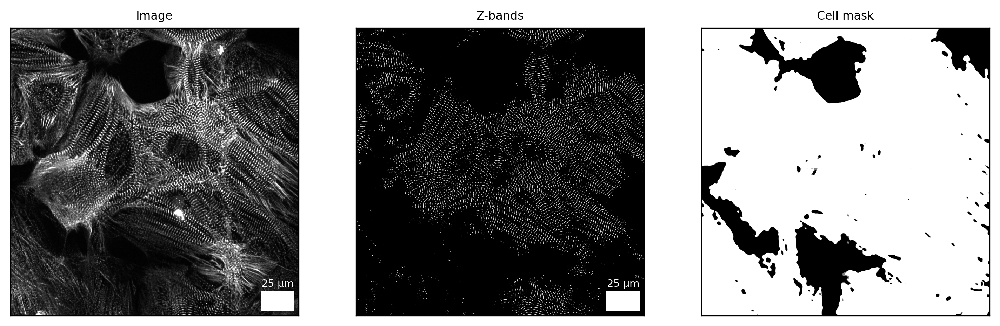

In [5]:
# visualize sarcomere z-bands and cell mask
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

frame = 33

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')

# z-bands
Plots.plot_z_bands(axs[1], sarc_obj, frame=frame, title='Z-bands')

# cell mask
Plots.plot_cell_mask(axs[2], sarc_obj, frame=frame, title='Cell mask')

plt.show()

### Analysis of sarcomere Z-bands


In [ ]:
# analyze z-bands
sarc_obj.structure.analyze_z_bands()

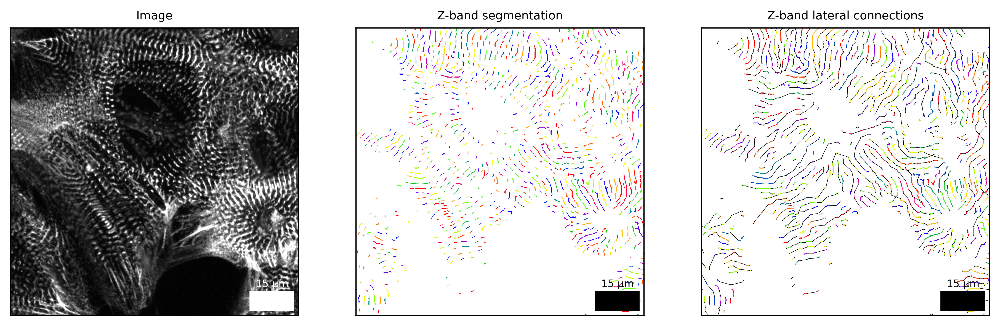

In [6]:
# visualize z-band segmentation and lateral connections
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=500)

frame = 32

xlim, ylim = (300, 1200), (300, 1200)

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

# z-band segmentation
Plots.plot_z_segmentation(axs[1], sarc_obj, frame=frame, title='Z-band segmentation')
axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)

# lateral connections
Plots.plot_z_lateral_connections(axs[2], sarc_obj, frame=frame, title='Z-band lateral connections')
axs[2].set_xlim(xlim)
axs[2].set_ylim(ylim)

plt.show()

### Analysis of sarcomere vectors


In [7]:
# analysis of sarcomere vectors (only for one frame, set frame=='all' for all frames)

frame = 33

sarc_obj.structure.analyze_sarcomere_vectors(frames=frame)

# optimize parameter 'minor', minor axis length of wavelet (optional)
minor = sarc_obj.structure.optimize_wavelet_minor_axis(frame=frame)

# analyze sarcomere vectors again with optimized 'minor'
sarc_obj.structure.analyze_sarcomere_vectors(frames=frame, minor=minor)


Starting sarcomere length and orientation analysis...


100%|██████████| 1/1 [00:10<00:00, 10.30s/it]



Starting sarcomere length and orientation analysis...


100%|██████████| 1/1 [00:10<00:00, 10.65s/it]


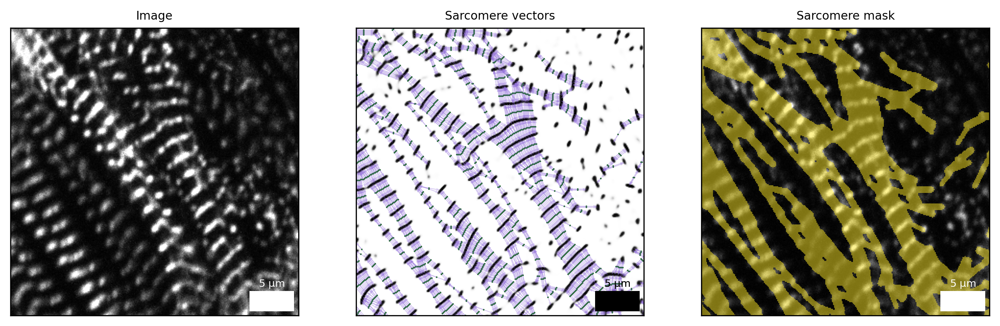

In [8]:
# visualize sarcomere vectors
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

xlim, ylim = (500, 800), (600, 900)

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

# sarcomere vectors (adjust parameters 'linewidths' and 's_points')
Plots.plot_sarcomere_vectors(axs[1], sarc_obj, frame=frame, linewidths=0.003, s_points=10, title='Sarcomere vectors')
axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)

# sarcomere mask
Plots.plot_sarcomere_area(axs[2], sarc_obj, frame=frame, title='Sarcomere mask')
axs[2].set_xlim(xlim)
axs[2].set_ylim(ylim)

plt.show() 

### Analysis of myofibrils

In [9]:
# myofibril analysis
sarc_obj.structure.analyze_myofibrils(frames=frame)


Starting myofibril line analysis...


100%|██████████| 1/1 [00:03<00:00,  3.80s/it]


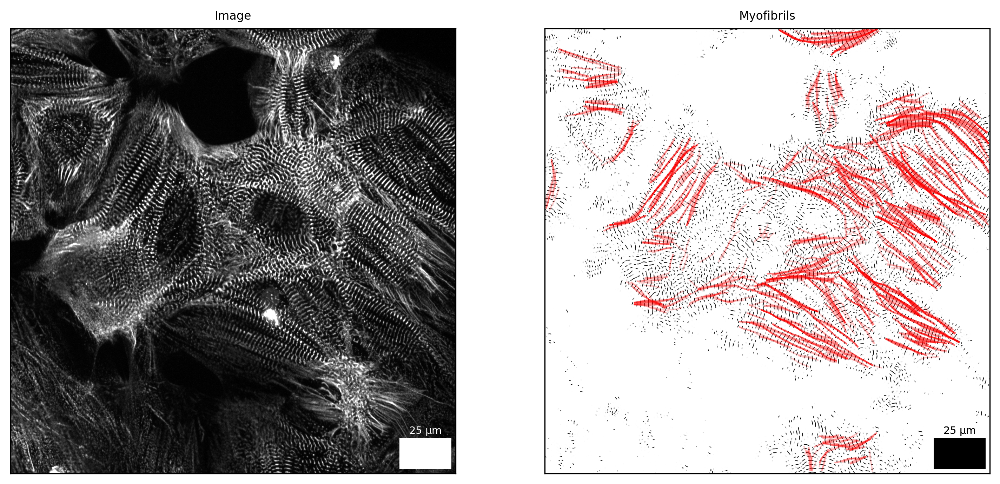

In [10]:
# visualize myofibrils
fig, axs = plt.subplots(ncols=2, figsize=(12, 6), dpi=300)

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')

# myofibril lines
Plots.plot_myofibrils(axs[1], sarc_obj, frame=frame, title='Myofibrils')

plt.show()

### Clustering of sarcomere domains

In [11]:
# analyze sarcomere domains
sarc_obj.structure.analyze_sarcomere_domains(frames=frame)


Starting sarcomere domain analysis...


100%|██████████| 1/1 [00:05<00:00,  5.79s/it]


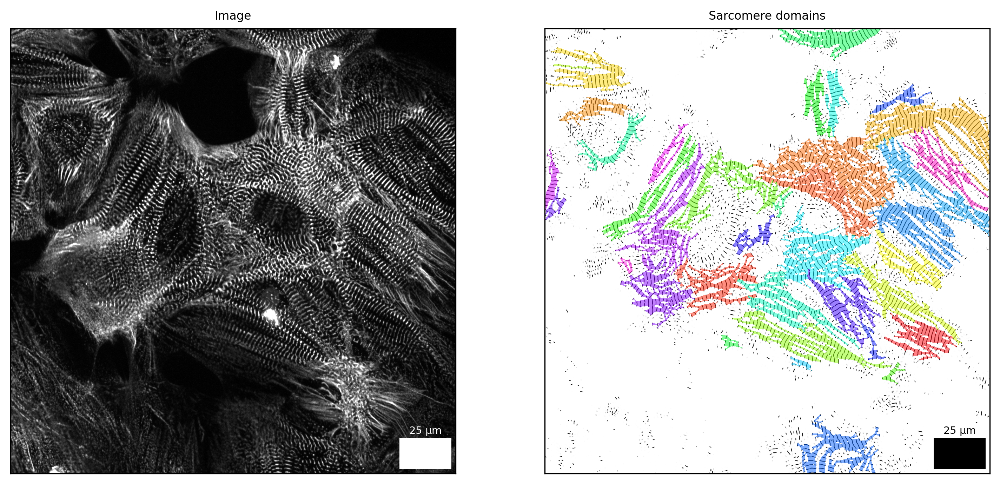

In [12]:
# visualize sarcomere domains
fig, axs = plt.subplots(ncols=2, figsize=(12, 6), dpi=300)

# image
Plots.plot_image(axs[0], sarc_obj, frame=frame, title='Image')

# myofibril lines
Plots.plot_sarcomere_domains(axs[1], sarc_obj, frame=frame, title='Sarcomere domains')

plt.show()

## Motion analysis

### Automated detection of lines of interest (LOIs) for motion tracking


In [13]:
# enter path of tif-file, can be both single image and movie
filepath = './test_data/high_speed_single_ACTN2-citrine_CM/30kPa.tif'

# initialize SarcAsM object
sarc_obj = SarcAsM(filepath)

# for Apple Silicon (e.g., M1), use 'cpu' as device, 3D maxpool operation is not yet implemented for MPS. On CPU, prediction takes ~20 min, while on CUDA-capable GPU just ~1 min.
# import torch
# sarc_obj = SarcAsM(filepath, device=torch.device('cpu'))

In [ ]:
# prediction of Z-bands using deep learning (using 3D U-Net for better temporal consistency)
sarc_obj.structure.predict_z_bands(time_consistent=True, size=(16, 256, 1024))

# analysis of sarcomere length and orientation (only single frame)
sarc_obj.structure.analyze_sarcomere_vectors(frames=0)

In [ ]:
# detect 2 LOIs
sarc_obj.structure.detect_lois(n_lois=2, persistence=6, random_seed=123, mode='fit_straight_line')

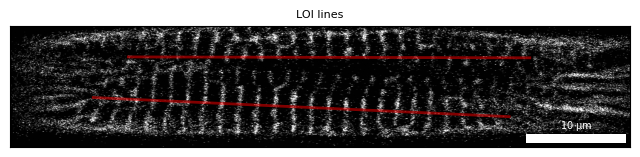

In [14]:
# plot automatically detected LOIs
fig, ax = plt.subplots(figsize=(8, 3))

# plot image
Plots.plot_image(ax, sarc_obj, show_loi=True, title='LOI lines')

### Initialization of Motion object for LOI


In [15]:
# get a list of all LOIs of a SarcAsM object 
lois = sarc_obj.structure.get_list_lois()

# select LOI from list and initialize Motion object
i = 0  # index of LOI
file, roi = lois[i]
mot_obj = Motion(file, roi)

In [16]:
# full analysis of LOI
mot_obj.full_analysis_loi()

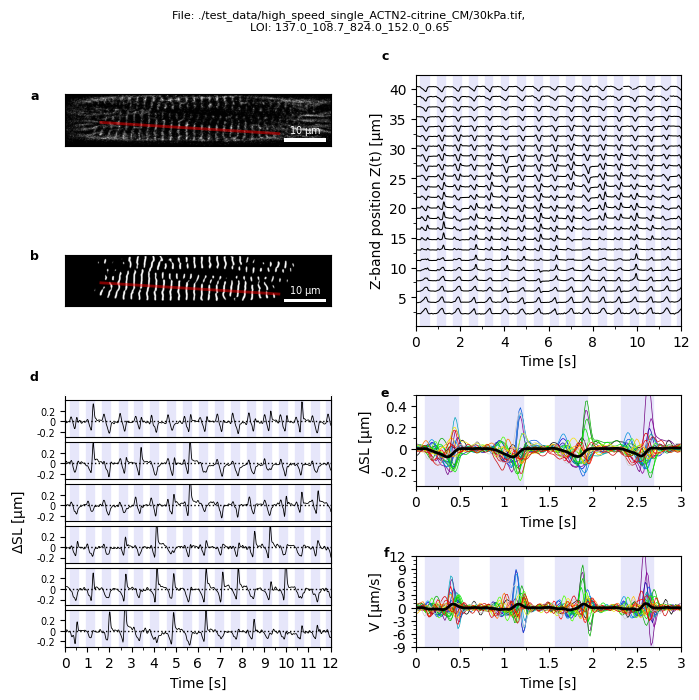

In [17]:
# create a summary figure of LOI
Plots.plot_loi_summary_motion(mot_obj)